**IMAGE SEGMENTATION**

pdf available on https://www.math.u-bordeaux.fr/~npapadak/TP/TP2.pdf

In [17]:
! pip install scikit-fmm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [18]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib
import skfmm

# Artificial Image

We study here a perfectly seperated image from background. On a perfectly gray image we draw a white circle.



## Initialization


<PIL.Image.Image image mode=L size=214x212 at 0x7F8F946E5370>


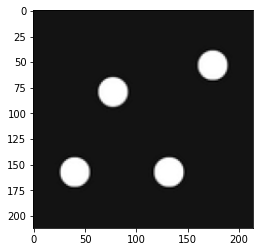

In [19]:

img = Image.open("/content/coins.png").convert("L")

print(img)
I = np.asarray(img)
plt.imshow(I,cmap="gray")

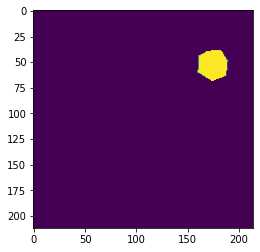

In [22]:
mask = np.load("/content/Initial_contour.npy",allow_pickle=True)

plt.imshow(mask)

We use the library roipoly to define a polygon forming the region of interest. Available on https://github.com/jdoepfert/roipoly.py. 

User must run the python script 

  Chan-Vese level set formulation consists in introducing a surface ϕ : x ∈ Ω ↦ R whose 0 level (ϕ(x) = 0) represents the contour of interest in the image domain, i.e. the boundary ∂Su between the foreground and
background regions


We initialize the distance from the mask ϕ .



In [25]:
def signed_distance_from_mask(mask):
  Dm=skfmm.distance(mask)  #compute the distance to the region mask=1
  Dp=skfmm.distance(1-mask) #compute the distance to the region mask=0
  phi=Dp-Dm
  return phi


In [26]:
phi_0_basic = signed_distance_from_mask(mask)


## Alternate minimization


In [27]:
eta = 1
def H (eta, phi):
  # Heaviside function
   return (1.+2.*np.arctan(phi/eta)/np.pi)/2

def delta (eta,phi):
  return 1/((1 + (phi/eta)**2)*eta*np.pi)

def gradx(I):
  m,n=np.shape(I)
  M=np.zeros((m,n))
  M[:-1,:]=-I[:-1,:]+I[1:,:];
  M[-1,:]=np.zeros(n)
  return M

def grady(I):
  m,n=np.shape(I);
  M=np.zeros((m,n));

  M[:,0:-1]=-I[:,:-1]+I[:,1:]
  M[:,-1]=np.zeros(m)
  return M
def grad(I):
  return np.array([gradx(I), grady(I)])

def div(P):
  px,py = P[0], P[1]
  m,n = np.shape(px)

  M=np.zeros((m,n))
  
  Mx=M
  My=M

  Mx[1:-1,:] = px[1:-1,:]- px[:-2,:]
  Mx[0,:] = px[0,:]
  Mx[-1,:] = -px[-1,:]

  My[:,1:-1]=py[:,1:-1]-py[:,:-2]
  My[:,0]=py[:,1]
  My[:,-1]=-py[:,n-1]

  M = Mx + My

  return M    



In [28]:
def alternate_optim(I, step,phi0,tol,eps,lamb,iterations=100):
  phi = np.copy(phi0)

  verif = True

  for n in range(iterations):
    phi_1 = phi
    c1 = np.sum(I * H(eta, phi) )/ np.sum(H(eta, phi))
    c2 = np.sum(I * (1-H(eta, phi))) / np.sum(1-H(eta, phi))
    phi = phi + step * delta(eta, phi)* (div(grad(phi/np.linalg.norm(grad(phi)) + eps)) - lamb * (I - c1)**2 + lamb*(I-c2)**2 )
    if n% 10 == 0 :
      phi[phi<0] = 0 
      phi = signed_distance_from_mask(phi)
      plt.figure()
      plt.title("evolution of the mask at i = {} ".format(n))
      plt.imshow(phi>0)
      plt.colorbar()
      plt.show()
  return phi,c1,c2


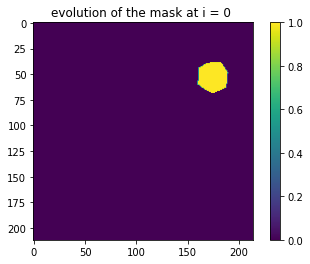

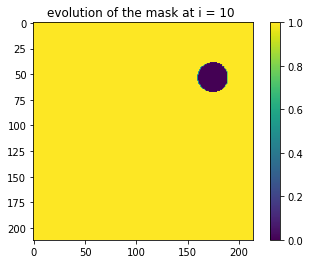

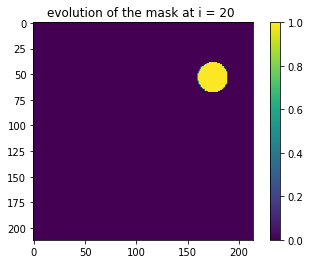

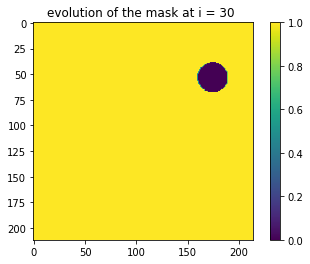

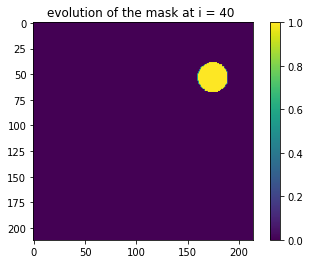

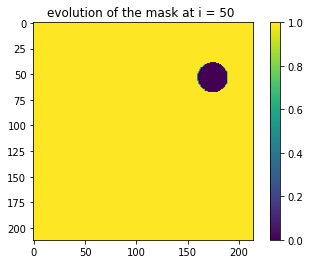

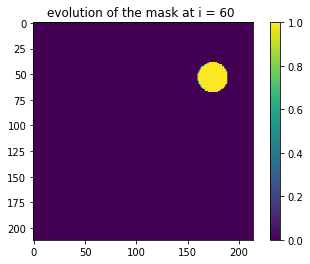

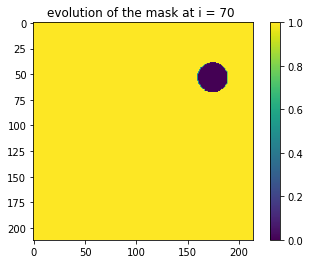

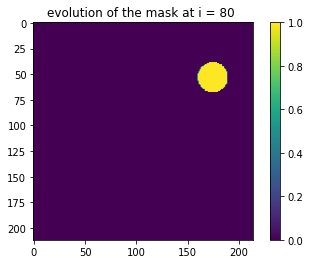

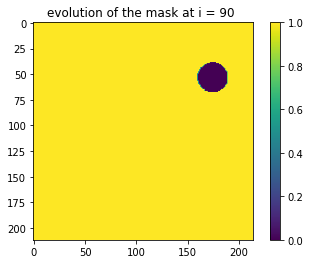

In [29]:
phi_hat_basic, c1_hat, c2_hat = alternate_optim(I, step=1,phi0=phi_0_basic,tol = 1e-12,eps=1,lamb=1e-4)

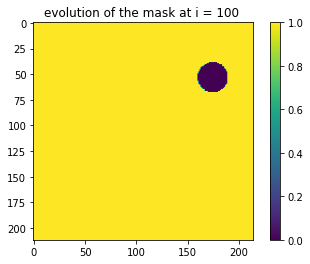

In [30]:
plt.figure()
plt.title("evolution of the mask at i = {} ".format(100))
plt.imshow(phi_hat_basic>0)
plt.colorbar()
plt.show()

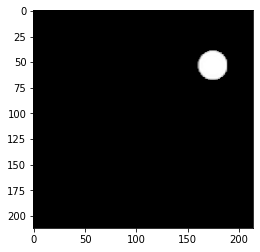

In [31]:
u_basic = phi_hat_basic > 0

plt.imshow(I * (1-u_basic),cmap='gray')

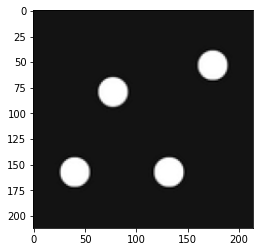

In [32]:
plt.imshow(I,cmap='gray')


# 2 coins


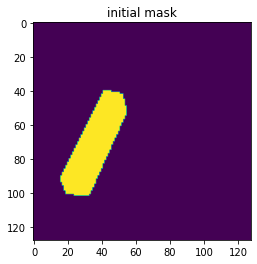

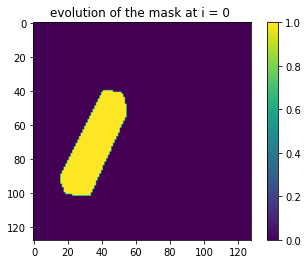

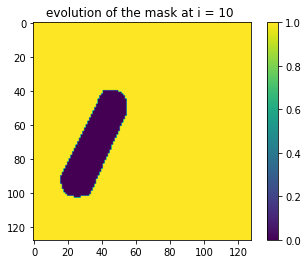

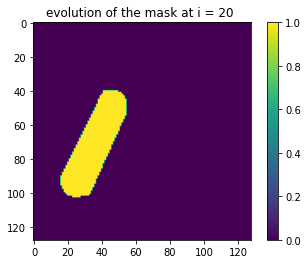

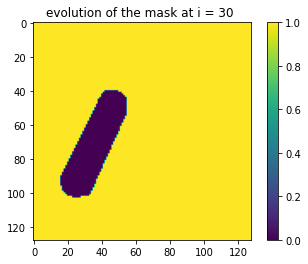

...

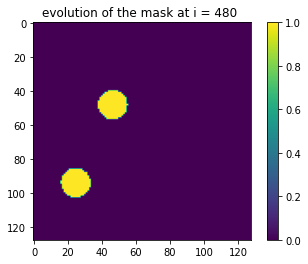

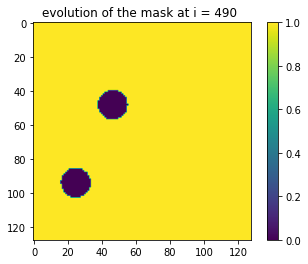

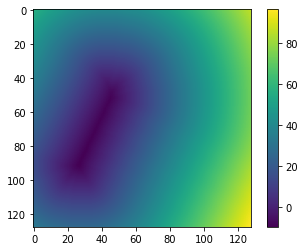

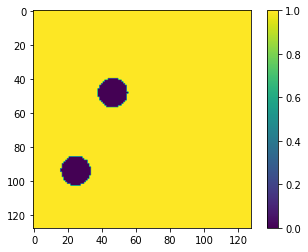

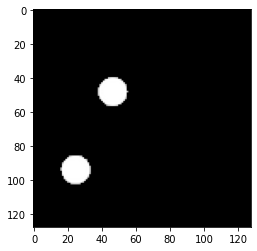

In [ ]:
bigmask = np.load("/content/two_mask.npy")

plt.imshow(bigmask)
plt.title("initial mask")
plt.show()
phi_0 = signed_distance_from_mask(bigmask)

phi_hat, c1_hat, c2_hat = alternate_optim(I, step=1, phi0=phi_0,tol = 1e-12,eps=1,lamb=1e-4,iterations=500)

u = phi_hat > 0

plt.imshow(phi_0)
plt.colorbar()

plt.show()
plt.imshow(u)
plt.colorbar()
plt.show()
plt.imshow(I * (1-u),cmap='gray')

# all Coins


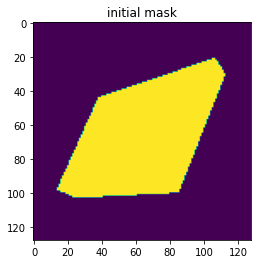

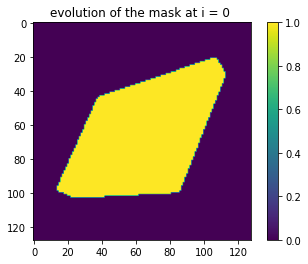

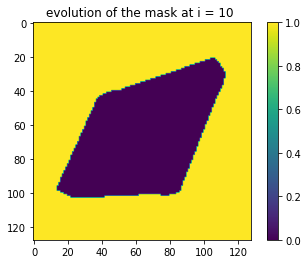

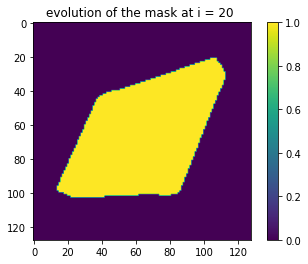

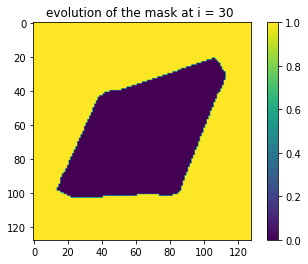

...

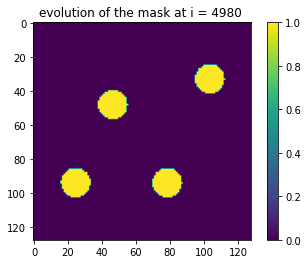

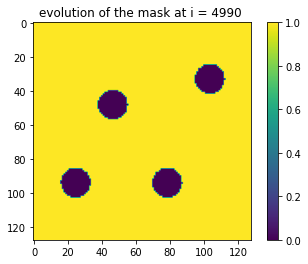

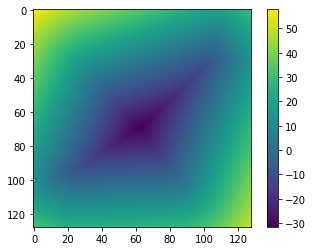

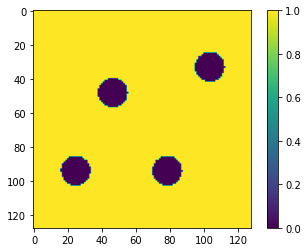

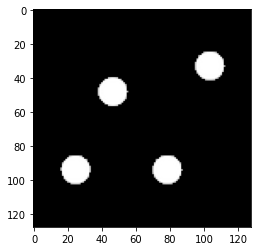

In [ ]:
bigmask = np.load("/content/large_mask.npy")

plt.imshow(bigmask)
plt.title("initial mask")
plt.show()
phi_0 = signed_distance_from_mask(bigmask)

phi_hat, c1_hat, c2_hat = alternate_optim(I, step=1, phi0=phi_0,tol = 1e-12,eps=1,lamb=1e-4,iterations=5000)

u = phi_hat > 0

plt.imshow(phi_0)
plt.colorbar()

plt.show()
plt.imshow(u)
plt.colorbar()
plt.show()
plt.imshow(I * (1-u),cmap='gray')

#CAMERAMAN

<PIL.Image.Image image mode=L size=487x490 at 0x7F9DA1C8E460>


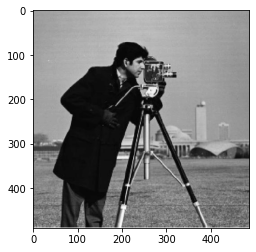

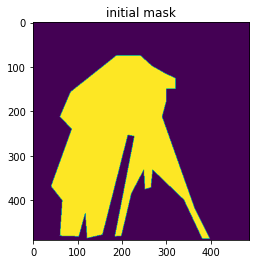

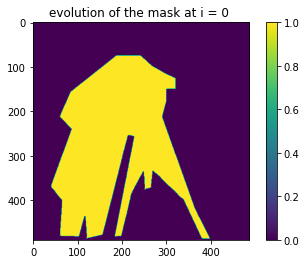

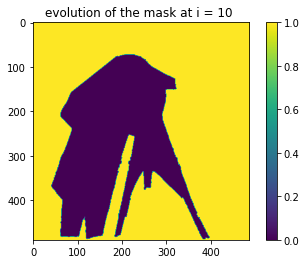

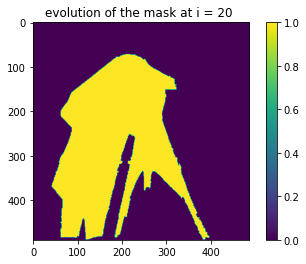

...

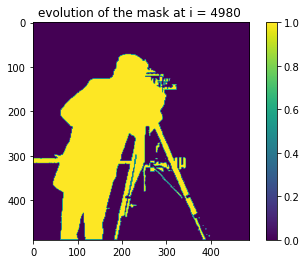

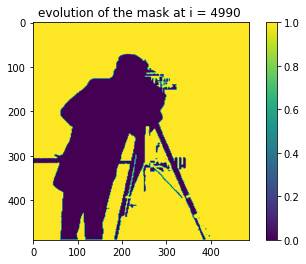

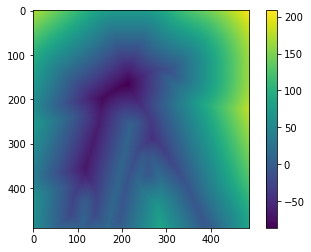

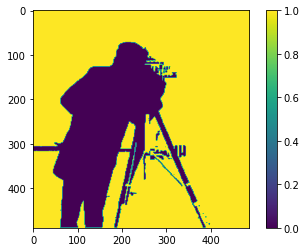

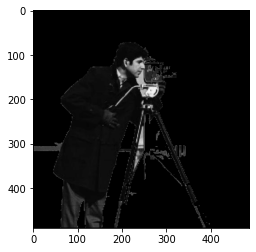

In [ ]:
cameramanmask = np.load("/content/cameraman_mask.npy")

img = Image.open("/content/cameraman.png").convert("L")

print(img)
I = np.asarray(img)
plt.imshow(I,cmap="gray")
plt.show()

plt.imshow(cameramanmask)
plt.title("initial mask")
plt.show()
phi_0 = signed_distance_from_mask(cameramanmask)

phi_hat, c1_hat, c2_hat = alternate_optim(I, step=1, phi0=phi_0,tol = 1e-12,eps=1,lamb=1e-4,iterations=5000)

u = phi_hat > 0

plt.imshow(phi_0)
plt.colorbar()

plt.show()
plt.imshow(u)
plt.colorbar()
plt.show()
plt.imshow(I * (1-u),cmap='gray')